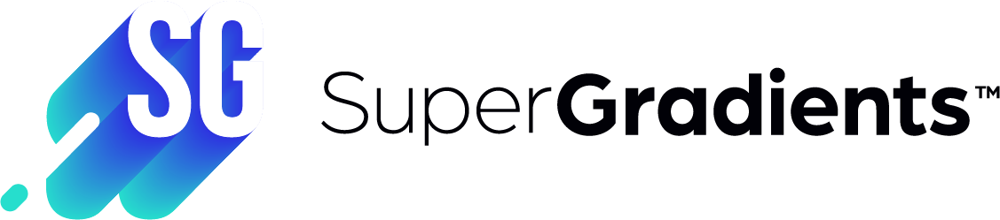

# SuperGradients Semantic Segmentation Quickstart

This short quickstart tutorial uses SuperGradients to:

- Download Supervisely semantic segmentation dataset

- Build PPLiteSeg model

- Train and evaluate it on Supervisely dataset

## Install SuperGradients

In [1]:
! pip install https://deci-pretrained-models.s3.amazonaws.com/super_gradients-1.8.0rc4308l-py3-none-any.whl gwpy &> /dev/null

## Download supervisely dataset

Feel free to change the download path by editing SUPERVISELY_DATASET_DOWNLOAD_PATH

In [2]:
import os

SUPERVISELY_DATASET_DOWNLOAD_PATH="/home/data"

supervisely_dataset_dir_path = SUPERVISELY_DATASET_DOWNLOAD_PATH + os.path.sep + 'supervisely-persons'

if os.path.isdir(supervisely_dataset_dir_path):
    print('supervisely dataset already downloaded...')
else:
    print('Downloading and extracting supervisely dataset to: ' + SUPERVISELY_DATASET_DOWNLOAD_PATH)
    ! mkdir $SUPERVISELY_DATASET_DOWNLOAD_PATH
    %cd $SUPERVISELY_DATASET_DOWNLOAD_PATH
    ! wget https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
    ! unzip --qq supervisely-persons.zip

/home/data
--2022-09-12 13:15:52--  https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
Resolving deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)... 52.216.144.227
Connecting to deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)|52.216.144.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3564001012 (3.3G) [application/zip]
Saving to: ‘supervisely-persons.zip’

supervisely-persons 100%[===================>]   3.32G  27.9MB/s    in 1m 42s  

2022-09-12 13:17:34 (33.3 MB/s) - ‘supervisely-persons.zip’ saved [3564001012/3564001012]



## Initiate Dataloaders
The dataloaders are initiated with the default parameters defined in the [yaml](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/dataset_params/supervisely_persons_dataset_params.yaml)
file. Parameters as batch_size, transforms, root_dir and others can be overridden by passing as `dataset_params` and
`dataloader_params`, as implemented bellow.

In [3]:
from super_gradients.training import dataloaders

root_dir = supervisely_dataset_dir_path
batch_size = 8

train_loader = dataloaders.supervisely_persons_train(dataset_params={"root_dir": root_dir}, dataloader_params={"batch_size": batch_size})
valid_loader = dataloaders.supervisely_persons_val(dataset_params={"root_dir": root_dir}, dataloader_params={"batch_size": batch_size})

You did not mention an AWS environment.You can set the environment variable ENVIRONMENT_NAME with one of the values: development,staging,production
quantization_utils -WARNING- Failed to import pytorch_quantization
env_sanity_check -INFO- ** A sanity check is done when importing super_gradients for the first time. **
-> You can see the details by setting the env variable DISPLAY_SANITY_CHECK=True prior to import.


/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):
/usr/local/lib/python3.7/dist-packages/super_gradients/training/dataloaders/dataloaders.py:53: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize_config_dir(config_dir=pkg_resources.resource_filename("super_gradients.recipes", "")):


## Initiate PPLiteSeg-T Module
Create a PPLiteSeg nn.Module, with 1 class segmentation head classifier. For simplicity `use_aux_head` is set as `False`
and extra Auxiliary heads aren't used for training.

Other segmentation modules can be used for this task such as, DDRNet, STDC and RegSeg.

Full list of supported architectures
can be found in [all_architectures.py](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/training/models/all_architectures.py)

In [4]:
from super_gradients.training import models

model = models.get(name="pp_lite_t_seg",
                   arch_params={"use_aux_heads": False},
                   num_classes=1)

## Defining Training HyperParameters
Here we define the training recipe. Although most parameters will probably look familiar, be sure to see our documentation of the full [training parameters supported](https://deci-ai.github.io/super-gradients/user_guide.html#training-parameters).

We will be using an average of BCE and Dice loss for segmentation, with different learning rates for the replaced segmentation head layer, and the rest of the network- this is controlled by the `multiply_head_lr` parameter which is the multiplication factor of the learning rate for the newly replaced layer.

As our `metric_to_watch`, we will be monitoring the `target_IOU` which is ont of the components of `BinaryIOU` torchmetrics object (the other components are `mean_IOU` which is the mean of the background and target IOUs, and `background_IOU`). When not familiar with torchmetrics, and how they are integrated in SuperGradients see https://torchmetrics.readthedocs.io/en/latest/ , https://deci-ai.github.io/super-gradients/user_guide.html#integrating-your-training-code-complete-walkthrough-metrics .

In [5]:
from super_gradients.training.metrics.segmentation_metrics import BinaryIOU
from super_gradients.training.utils.callbacks import BinarySegmentationVisualizationCallback, Phase

train_params = {"max_epochs": 50,
                "lr_mode": "cosine",
                "initial_lr": 0.01,
                "lr_warmup_epochs": 5,
                "multiply_head_lr": 10,
                "optimizer": "SGD",
                "loss": "bce_dice_loss",
                "ema": True,
                "zero_weight_decay_on_bias_and_bn": True,
                "average_best_models": True,
                "metric_to_watch": "target_IOU",
                "greater_metric_to_watch_is_better": True,
                "train_metrics_list": [BinaryIOU()],
                "valid_metrics_list": [BinaryIOU()],
                "loss_logging_items_names": ["loss"],
                "phase_callbacks": [BinarySegmentationVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,
                                                                            freq=1,
                                                                            last_img_idx_in_batch=4)],
                }

# Initiate a Trainer object
In this notebook multi-gpu training is set as `OFF`, for Distributed training multi_gpu can be set as
 `MultiGPUMode.DISTRIBUTED_DATA_PARALLEL` or `MultiGPUMode.DATA_PARALLEL`.

In [6]:
from super_gradients.training import Trainer, MultiGPUMode

trainer = Trainer(experiment_name="segmentation_quick_start", multi_gpu=MultiGPUMode.OFF)

# Start training and evaluation
Make sure to visit the IMAGES tab inside tensorboard once every few epochs to see the predictions improvement on some sample images-
- True positive pixels - $\color {green}{\text{segmented in Green}}$
- False positive pixels - $\color {blue}{\text{segmented in Blue}}$ 
- False negative pixels - $\color {red}{\text{segmented in Red}}$

In [12]:
%load_ext tensorboard
%tensorboard --logdir /home/data/checkpoints/segmentation_quick_start --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [13]:
trainer.train(model=model, training_params=train_params, train_loader=train_loader, valid_loader=valid_loader)

sg_trainer -INFO- Using EMA with params {}
"events.out.tfevents.1662988766.d348896decb1.71.0" will not be deleted
sg_trainer -INFO- Started training for 50 epochs (0/49)



Train epoch 0:   0%|          | 0/309 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:393: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  FutureWarning)
Validation epoch 0: 100%|██████████| 65/65 [00:17<00:00,  3.70it/s]


SUMMARY OF EPOCH 0
├── Training
│   └── Loss = 0.306
└── Validation
    ├── Loss = 0.422
    └── Target_iou = 0.6759

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.6759125590324402


Validation epoch 1: 100%|██████████| 65/65 [00:16<00:00,  3.83it/s]


SUMMARY OF EPOCH 1
├── Training
│   └── Loss = 0.3064
│       ├── Best until now = 0.306  (↗ 0.0005)
│       └── Epoch N-1      = 0.306  (↗ 0.0005)
└── Validation
    ├── Loss = 0.3792
    │   ├── Best until now = 0.422  (↘ -0.0428)
    │   └── Epoch N-1      = 0.422  (↘ -0.0428)
    └── Target_iou = 0.7118
        ├── Best until now = 0.6759 (↗ 0.0359)
        └── Epoch N-1      = 0.6759 (↗ 0.0359)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7117772102355957


Validation epoch 2: 100%|██████████| 65/65 [00:17<00:00,  3.77it/s]


SUMMARY OF EPOCH 2
├── Training
│   └── Loss = 0.2999
│       ├── Best until now = 0.306  (↘ -0.006)
│       └── Epoch N-1      = 0.3064 (↘ -0.0065)
└── Validation
    ├── Loss = 0.4036
    │   ├── Best until now = 0.3792 (↗ 0.0243)
    │   └── Epoch N-1      = 0.3792 (↗ 0.0243)
    └── Target_iou = 0.7154
        ├── Best until now = 0.7118 (↗ 0.0036)
        └── Epoch N-1      = 0.7118 (↗ 0.0036)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7153875827789307


Validation epoch 3: 100%|██████████| 65/65 [00:17<00:00,  3.75it/s]


SUMMARY OF EPOCH 3
├── Training
│   └── Loss = 0.2868
│       ├── Best until now = 0.2999 (↘ -0.0132)
│       └── Epoch N-1      = 0.2999 (↘ -0.0132)
└── Validation
    ├── Loss = 0.3595
    │   ├── Best until now = 0.3792 (↘ -0.0197)
    │   └── Epoch N-1      = 0.4036 (↘ -0.0441)
    └── Target_iou = 0.7218
        ├── Best until now = 0.7154 (↗ 0.0065)
        └── Epoch N-1      = 0.7154 (↗ 0.0065)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7218486070632935


Validation epoch 4: 100%|██████████| 65/65 [00:17<00:00,  3.78it/s]


SUMMARY OF EPOCH 4
├── Training
│   └── Loss = 0.2785
│       ├── Best until now = 0.2868 (↘ -0.0082)
│       └── Epoch N-1      = 0.2868 (↘ -0.0082)
└── Validation
    ├── Loss = 0.3447
    │   ├── Best until now = 0.3595 (↘ -0.0148)
    │   └── Epoch N-1      = 0.3595 (↘ -0.0148)
    └── Target_iou = 0.7403
        ├── Best until now = 0.7218 (↗ 0.0184)
        └── Epoch N-1      = 0.7218 (↗ 0.0184)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7402817606925964


Validation epoch 5: 100%|██████████| 65/65 [00:17<00:00,  3.79it/s]


SUMMARY OF EPOCH 5
├── Training
│   └── Loss = 0.2781
│       ├── Best until now = 0.2785 (↘ -0.0004)
│       └── Epoch N-1      = 0.2785 (↘ -0.0004)
└── Validation
    ├── Loss = 0.3759
    │   ├── Best until now = 0.3447 (↗ 0.0312)
    │   └── Epoch N-1      = 0.3447 (↗ 0.0312)
    └── Target_iou = 0.7138
        ├── Best until now = 0.7403 (↘ -0.0265)
        └── Epoch N-1      = 0.7403 (↘ -0.0265)



Validation epoch 6: 100%|██████████| 65/65 [00:17<00:00,  3.76it/s]


SUMMARY OF EPOCH 6
├── Training
│   └── Loss = 0.2703
│       ├── Best until now = 0.2781 (↘ -0.0078)
│       └── Epoch N-1      = 0.2781 (↘ -0.0078)
└── Validation
    ├── Loss = 0.3442
    │   ├── Best until now = 0.3447 (↘ -0.0005)
    │   └── Epoch N-1      = 0.3759 (↘ -0.0317)
    └── Target_iou = 0.7348
        ├── Best until now = 0.7403 (↘ -0.0055)
        └── Epoch N-1      = 0.7138 (↗ 0.021)



Validation epoch 7: 100%|██████████| 65/65 [00:17<00:00,  3.78it/s]


SUMMARY OF EPOCH 7
├── Training
│   └── Loss = 0.2541
│       ├── Best until now = 0.2703 (↘ -0.0162)
│       └── Epoch N-1      = 0.2703 (↘ -0.0162)
└── Validation
    ├── Loss = 0.3188
    │   ├── Best until now = 0.3442 (↘ -0.0254)
    │   └── Epoch N-1      = 0.3442 (↘ -0.0254)
    └── Target_iou = 0.7552
        ├── Best until now = 0.7403 (↗ 0.0149)
        └── Epoch N-1      = 0.7348 (↗ 0.0204)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7552171349525452


Validation epoch 8: 100%|██████████| 65/65 [00:17<00:00,  3.81it/s]


SUMMARY OF EPOCH 8
├── Training
│   └── Loss = 0.2555
│       ├── Best until now = 0.2541 (↗ 0.0014)
│       └── Epoch N-1      = 0.2541 (↗ 0.0014)
└── Validation
    ├── Loss = 0.3366
    │   ├── Best until now = 0.3188 (↗ 0.0178)
    │   └── Epoch N-1      = 0.3188 (↗ 0.0178)
    └── Target_iou = 0.7462
        ├── Best until now = 0.7552 (↘ -0.009)
        └── Epoch N-1      = 0.7552 (↘ -0.009)



Validation epoch 9: 100%|██████████| 65/65 [00:16<00:00,  3.83it/s]


SUMMARY OF EPOCH 9
├── Training
│   └── Loss = 0.2455
│       ├── Best until now = 0.2541 (↘ -0.0086)
│       └── Epoch N-1      = 0.2555 (↘ -0.01)
└── Validation
    ├── Loss = 0.3049
    │   ├── Best until now = 0.3188 (↘ -0.0139)
    │   └── Epoch N-1      = 0.3366 (↘ -0.0317)
    └── Target_iou = 0.7638
        ├── Best until now = 0.7552 (↗ 0.0085)
        └── Epoch N-1      = 0.7462 (↗ 0.0175)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.763757586479187


Validation epoch 10: 100%|██████████| 65/65 [00:16<00:00,  3.84it/s]


SUMMARY OF EPOCH 10
├── Training
│   └── Loss = 0.2363
│       ├── Best until now = 0.2455 (↘ -0.0092)
│       └── Epoch N-1      = 0.2455 (↘ -0.0092)
└── Validation
    ├── Loss = 0.3111
    │   ├── Best until now = 0.3049 (↗ 0.0062)
    │   └── Epoch N-1      = 0.3049 (↗ 0.0062)
    └── Target_iou = 0.7619
        ├── Best until now = 0.7638 (↘ -0.0019)
        └── Epoch N-1      = 0.7638 (↘ -0.0019)



Validation epoch 11: 100%|██████████| 65/65 [00:17<00:00,  3.82it/s]


SUMMARY OF EPOCH 11
├── Training
│   └── Loss = 0.233
│       ├── Best until now = 0.2363 (↘ -0.0033)
│       └── Epoch N-1      = 0.2363 (↘ -0.0033)
└── Validation
    ├── Loss = 0.2922
    │   ├── Best until now = 0.3049 (↘ -0.0127)
    │   └── Epoch N-1      = 0.3111 (↘ -0.0189)
    └── Target_iou = 0.7708
        ├── Best until now = 0.7638 (↗ 0.007)
        └── Epoch N-1      = 0.7619 (↗ 0.0089)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7707768082618713


Validation epoch 12: 100%|██████████| 65/65 [00:17<00:00,  3.76it/s]


SUMMARY OF EPOCH 12
├── Training
│   └── Loss = 0.2315
│       ├── Best until now = 0.233  (↘ -0.0015)
│       └── Epoch N-1      = 0.233  (↘ -0.0015)
└── Validation
    ├── Loss = 0.2909
    │   ├── Best until now = 0.2922 (↘ -0.0013)
    │   └── Epoch N-1      = 0.2922 (↘ -0.0013)
    └── Target_iou = 0.7717
        ├── Best until now = 0.7708 (↗ 0.0009)
        └── Epoch N-1      = 0.7708 (↗ 0.0009)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7717130780220032


Validation epoch 13: 100%|██████████| 65/65 [00:17<00:00,  3.78it/s]


SUMMARY OF EPOCH 13
├── Training
│   └── Loss = 0.2293
│       ├── Best until now = 0.2315 (↘ -0.0022)
│       └── Epoch N-1      = 0.2315 (↘ -0.0022)
└── Validation
    ├── Loss = 0.2773
    │   ├── Best until now = 0.2909 (↘ -0.0136)
    │   └── Epoch N-1      = 0.2909 (↘ -0.0136)
    └── Target_iou = 0.7815
        ├── Best until now = 0.7717 (↗ 0.0098)
        └── Epoch N-1      = 0.7717 (↗ 0.0098)

base_sg_logger -INFO- Checkpoint saved in /home/data/checkpoints/segmentation_quick_start/ckpt_best.pth
sg_trainer -INFO- Best checkpoint overriden: validation target_IOU: 0.7815470695495605


Train epoch 14:  60%|█████▉    | 184/309 [01:15<00:51,  2.44it/s, background_IOU=0.788, gpu_mem=0.858, loss=0.182, mean_IOU=0.817, target_IOU=0.846]

sg_trainer -INFO- 
[MODEL TRAINING EXECUTION HAS BEEN INTERRUPTED]... Please wait until SOFT-TERMINATION process finishes and saves all of the Model Checkpoints and log files before terminating...
sg_trainer -INFO- For HARD Termination - Stop the process again


In [14]:
print("Best Checkpoint mIoU is: "+ str(trainer.best_metric.item()))

Best Checkpoint mIoU is: 0.7815470695495605


Now you can download your trained weights from this directory

In [15]:
print(trainer.checkpoints_dir_path)

/home/data/checkpoints/segmentation_quick_start


Once training is finished, the trained model can be accessed through *trainer.net*. All of the [architectures](https://deci-ai.github.io/super-gradients/user_guide.html#network-architectures) offered by SuperGradients compilation processes have been verified and can be uploaded to [Deci Lab](https://docs.deci.ai/docs/quickstart) for runtime optimization (including quantization and graph compilers) and benchmarking on various hardwares.  <!--Be sure to see how one can do so in our deci_platform integration tutorial <link>. -->

Now that we saw how easy it is to train models using SuperGradients, lets see a more comprehensive tutorial on customizing the different components of training
in our [Walkthrough Tutorial](https://colab.research.google.com/drive/1smwh4EAgE8PwnCtwsdU8a9D9Ezfh6FQK?usp=sharing). For simplicity, we used a very limited subset of the abundant training [hyperparameters](https://deci-ai.github.io/super-gradients/user_guide.html#training-parameters) SuperGradients has to offer.